In [1]:
!pip install calplot


In [2]:
!pip install prophet

In [3]:
# Analysis Tools
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import norm

# Plotting Tools
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Extra Plotting Tools Required for Bar Chart Race
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML


import datetime
import calplot
 
# Prophet model 
from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric
from prophet.serialize import model_to_json, model_from_json




# Plot Design Settings
sns.set_style("darkgrid", {"axes.facecolor": "#eff2f5", 'grid.color': '#c0ccd8', 'patch.edgecolor': '#B0B0B0', 'font.sans-serif': 'Verdana'})
sns.set_palette('Blues_d')

plt.rc('font', size=19)
plt.rc('axes', titlesize=25)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=17)
plt.rc('ytick', labelsize=17)
plt.rc('figure', titlesize=24)


# Mute warnings
import warnings
warnings.filterwarnings('ignore')

C:\Users\AHMED\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [4]:
data = pd.read_csv('city_temperature.csv')
data.shape

(2906327, 8)

In [5]:
data


,Region,Country,State,City,Month,Day,Year,AvgTemperature
0,Africa,Algeria,NaN,Algiers,1,1,1995,64.2
1,Africa,Algeria,NaN,Algiers,1,2,1995,49.4
2,Africa,Algeria,NaN,Algiers,1,3,1995,48.8
3,Africa,Algeria,NaN,Algiers,1,4,1995,46.4
4,Africa,Algeria,NaN,Algiers,1,5,1995,47.9
...,...,...,...,...,...,...,...,...
2906322,North America,US,Additional Territories,San Juan Puerto Rico,7,27,2013,82.4
2906323,North America,US,Additional Territories,San Juan Puerto Rico,7,28,2013,81.6
2906324,North America,US,Additional Territories,San Juan Puerto Rico,7,29,2013,84.2
2906325,North America,US,Additional Territories,San Juan Puerto Rico,7,30,2013,83.8


In [6]:
data.head()

,Region,Country,State,City,Month,Day,Year,AvgTemperature
0,Africa,Algeria,NaN,Algiers,1,1,1995,64.2
1,Africa,Algeria,NaN,Algiers,1,2,1995,49.4
2,Africa,Algeria,NaN,Algiers,1,3,1995,48.8
3,Africa,Algeria,NaN,Algiers,1,4,1995,46.4
4,Africa,Algeria,NaN,Algiers,1,5,1995,47.9


features dtypes :

In [7]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2906327 entries, 0 to 2906326
Data columns (total 8 columns):
 #   Column          Dtype  
---  ------          -----  
 0   Region          object 
 1   Country         object 
 2   State           object 
 3   City            object 
 4   Month           int64  
 5   Day             int64  
 6   Year            int64  
 7   AvgTemperature  float64
dtypes: float64(1), int64(3), object(4)
memory usage: 177.4+ MB


In [8]:
data['AvgTemperature'].describe()


count    2.906327e+06
mean     5.600492e+01
std      3.212359e+01
min     -9.900000e+01
25%      4.580000e+01
50%      6.250000e+01
75%      7.550000e+01
max      1.100000e+02
Name: AvgTemperature, dtype: float64

Features Unique Values :

In [9]:
# Number of unique values in each variable
for var in data:
    print(var, ': ', data[var].nunique())

Region :  7
Country :  125
State :  52
City :  321
Month :  12
Day :  32
Year :  28
AvgTemperature :  1517


Missing Values :

In [10]:
for var in data:
    print(var, ': ', data[var].isnull().sum())

Region :  0
Country :  0
State :  1450990
City :  0
Month :  0
Day :  0
Year :  0
AvgTemperature :  0


<AxesSubplot:>

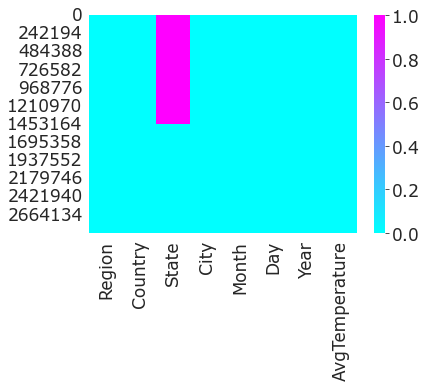

In [11]:
sns.heatmap(data.isnull(), cmap = "cool")


In [12]:
data = data.drop(['State'], axis=1)

Duplicates :

In [13]:
print('Number of Duplicates: {}'.format(len(data[data.duplicated()])))


Number of Duplicates: 20903


In [14]:
data = data.drop_duplicates()



Number of 'AvgTemperature' values for each year :

In [15]:
data.groupby('Year')['AvgTemperature'].count()


Year
200         60
201        235
1995    117880
1996    118210
1997    117921
1998    118334
1999    118616
2000    118946
2001    118618
2002    118601
2003    118405
2004    117910
2005    117158
2006    116910
2007    114677
2008    113818
2009    113508
2010    114526
2011    112308
2012    111256
2013    110284
2014    108284
2015    106763
2016    106499
2017    106209
2018    105657
2019    105290
2020     38541
Name: AvgTemperature, dtype: int64

In [16]:
data = data[data['Year']>1994]
data = data[data['Year']<2020]


Range of Days :

In [17]:
print('Day Range Min to Max: \n{}'.format(data['Day'].agg([min , max])))


Day Range Min to Max: 
min     0
max    31
Name: Day, dtype: int64


In [18]:
data = data[data['Day']>0]
print('1st Day: \n{}'.format(data['Day'].agg([min]))) 

1st Day: 
min    1
Name: Day, dtype: int64


Dropping all incomplete years :

In [19]:
data = data[data["Country"] == "Algeria"]


In [20]:
data.City.unique()


array(['Algiers'], dtype=object)

In [21]:
data = data[data["City"] == "Algiers"]
data

,Region,Country,City,Month,Day,Year,AvgTemperature
0,Africa,Algeria,Algiers,1,1,1995,64.2
1,Africa,Algeria,Algiers,1,2,1995,49.4
2,Africa,Algeria,Algiers,1,3,1995,48.8
3,Africa,Algeria,Algiers,1,4,1995,46.4
4,Africa,Algeria,Algiers,1,5,1995,47.9
...,...,...,...,...,...,...,...
9127,Africa,Algeria,Algiers,12,27,2019,51.1
9128,Africa,Algeria,Algiers,12,28,2019,50.3
9129,Africa,Algeria,Algiers,12,29,2019,50.9
9130,Africa,Algeria,Algiers,12,30,2019,49.9


In [22]:
data.describe().T


,count,mean,std,min,25%,50%,75%,max
Month,9132.0,6.523653,3.449145,1.0,4.0,7.0,10.0,12.0
Day,9132.0,15.730837,8.801206,1.0,8.0,16.0,23.0,31.0
Year,9132.0,2007.000219,7.211391,1995.0,2001.0,2007.0,2013.0,2019.0
AvgTemperature,9132.0,63.839389,14.796228,-99.0,55.2,63.6,74.0,96.6


In [23]:
data["datetime"] = data.apply(lambda x : datetime.datetime(x["Year"], x["Month"], x["Day"], 0, 0, 0, 0), axis=1)
data.index = data["datetime"].values
data

,Region,Country,City,Month,Day,Year,AvgTemperature,datetime
1995-01-01,Africa,Algeria,Algiers,1,1,1995,64.2,1995-01-01
1995-01-02,Africa,Algeria,Algiers,1,2,1995,49.4,1995-01-02
1995-01-03,Africa,Algeria,Algiers,1,3,1995,48.8,1995-01-03
1995-01-04,Africa,Algeria,Algiers,1,4,1995,46.4,1995-01-04
1995-01-05,Africa,Algeria,Algiers,1,5,1995,47.9,1995-01-05
...,...,...,...,...,...,...,...,...
2019-12-27,Africa,Algeria,Algiers,12,27,2019,51.1,2019-12-27
2019-12-28,Africa,Algeria,Algiers,12,28,2019,50.3,2019-12-28
2019-12-29,Africa,Algeria,Algiers,12,29,2019,50.9,2019-12-29
2019-12-30,Africa,Algeria,Algiers,12,30,2019,49.9,2019-12-30


In [24]:
data = data[data["AvgTemperature"] != -99]
data["TempInC"] = data["AvgTemperature"].apply(lambda x : (x-32)/1.8)
data

,Region,Country,City,Month,Day,Year,AvgTemperature,datetime,TempInC
1995-01-01,Africa,Algeria,Algiers,1,1,1995,64.2,1995-01-01,17.888889
1995-01-02,Africa,Algeria,Algiers,1,2,1995,49.4,1995-01-02,9.666667
1995-01-03,Africa,Algeria,Algiers,1,3,1995,48.8,1995-01-03,9.333333
1995-01-04,Africa,Algeria,Algiers,1,4,1995,46.4,1995-01-04,8.000000
1995-01-05,Africa,Algeria,Algiers,1,5,1995,47.9,1995-01-05,8.833333
...,...,...,...,...,...,...,...,...,...
2019-12-27,Africa,Algeria,Algiers,12,27,2019,51.1,2019-12-27,10.611111
2019-12-28,Africa,Algeria,Algiers,12,28,2019,50.3,2019-12-28,10.166667
2019-12-29,Africa,Algeria,Algiers,12,29,2019,50.9,2019-12-29,10.500000
2019-12-30,Africa,Algeria,Algiers,12,30,2019,49.9,2019-12-30,9.944444


In [25]:
data.dtypes


Region                    object
Country                   object
City                      object
Month                      int64
Day                        int64
Year                       int64
AvgTemperature           float64
datetime          datetime64[ns]
TempInC                  float64
dtype: object

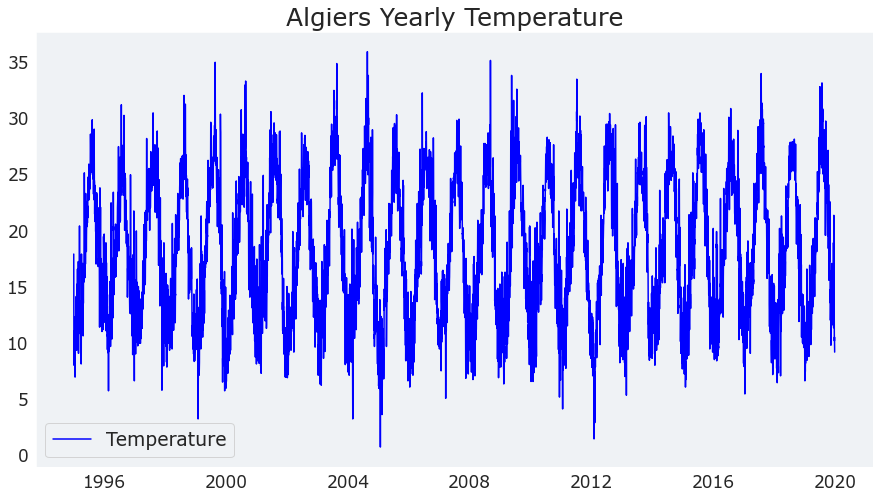

In [26]:
plt.figure(figsize=(15, 8))
plt.title("Algiers Yearly Temperature")
plt.plot(data['datetime'], data['TempInC'], color = 'blue', linewidth = 1.5, label = "Temperature")
plt.grid()
plt.legend(loc ="lower left")

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


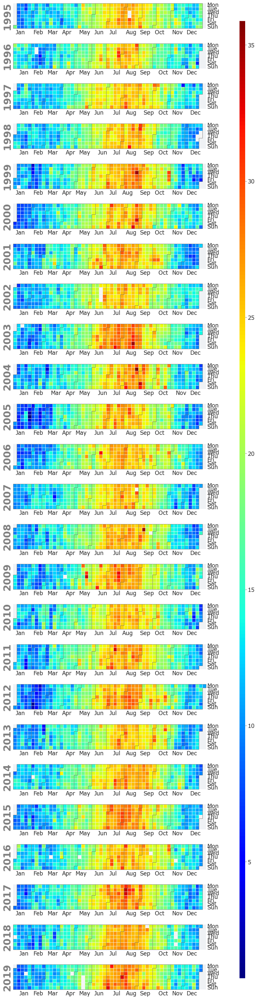

In [27]:
fig = calplot.calplot(data["TempInC"], how = "mean", cmap='jet')

In [28]:
n_df = data[['datetime', 'TempInC']]
n_df


,datetime,TempInC
1995-01-01,1995-01-01,17.888889
1995-01-02,1995-01-02,9.666667
1995-01-03,1995-01-03,9.333333
1995-01-04,1995-01-04,8.000000
1995-01-05,1995-01-05,8.833333
...,...,...
2019-12-27,2019-12-27,10.611111
2019-12-28,2019-12-28,10.166667
2019-12-29,2019-12-29,10.500000
2019-12-30,2019-12-30,9.944444


In [29]:
n_df.rename(columns = {'datetime' :'ds', 'TempInC' : 'y'}, inplace = True)


Prophet model :

In [30]:
model = Prophet()
model.fit(n_df)


03:06:28 - cmdstanpy - INFO - Chain [1] start processing
03:06:29 - cmdstanpy - INFO - Chain [1] done processing


In [31]:
df_future = model.make_future_dataframe(periods = 3650)
forecast = model.predict(df_future)

In [32]:
forecast


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1995-01-01,17.961456,8.263987,14.361055,17.961456,17.961456,-6.721177,-6.721177,-6.721177,0.017781,0.017781,0.017781,-6.738958,-6.738958,-6.738958,0.0,0.0,0.0,11.240279
1,1995-01-02,17.961272,8.216196,14.064259,17.961272,17.961272,-6.868761,-6.868761,-6.868761,-0.075423,-0.075423,-0.075423,-6.793338,-6.793338,-6.793338,0.0,0.0,0.0,11.092511
2,1995-01-03,17.961089,8.028896,13.986796,17.961089,17.961089,-6.896505,-6.896505,-6.896505,-0.049580,-0.049580,-0.049580,-6.846925,-6.846925,-6.846925,0.0,0.0,0.0,11.064584
3,1995-01-04,17.960906,7.986864,14.072285,17.960906,17.960906,-6.868628,-6.868628,-6.868628,0.030521,0.030521,0.030521,-6.899149,-6.899149,-6.899149,0.0,0.0,0.0,11.092277
4,1995-01-05,17.960722,7.878316,14.057874,17.960722,17.960722,-6.968434,-6.968434,-6.968434,-0.018987,-0.018987,-0.018987,-6.949447,-6.949447,-6.949447,0.0,0.0,0.0,10.992288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12742,2029-12-24,18.131679,8.816717,14.821578,17.441906,18.850408,-6.419388,-6.419388,-6.419388,-0.075423,-0.075423,-0.075423,-6.343964,-6.343964,-6.343964,0.0,0.0,0.0,11.712292
12743,2029-12-25,18.131648,8.245117,14.702382,17.441409,18.850776,-6.438697,-6.438697,-6.438697,-0.049580,-0.049580,-0.049580,-6.389117,-6.389117,-6.389117,0.0,0.0,0.0,11.692951
12744,2029-12-26,18.131617,8.637867,14.873700,17.440911,18.851169,-6.405942,-6.405942,-6.405942,0.030521,0.030521,0.030521,-6.436463,-6.436463,-6.436463,0.0,0.0,0.0,11.725675
12745,2029-12-27,18.131586,8.403341,14.419159,17.440413,18.851561,-6.504840,-6.504840,-6.504840,-0.018987,-0.018987,-0.018987,-6.485853,-6.485853,-6.485853,0.0,0.0,0.0,11.626746


In [33]:
pred = forecast.copy()


Forecsting the Temperature


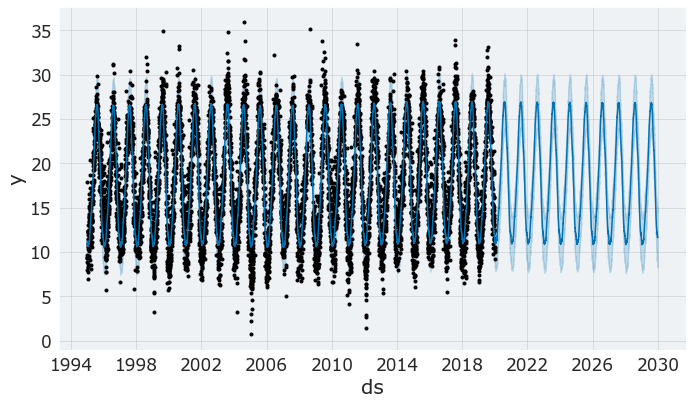

In [34]:
figure1 = model.plot(forecast)


In [35]:
plot_plotly(model, forecast)


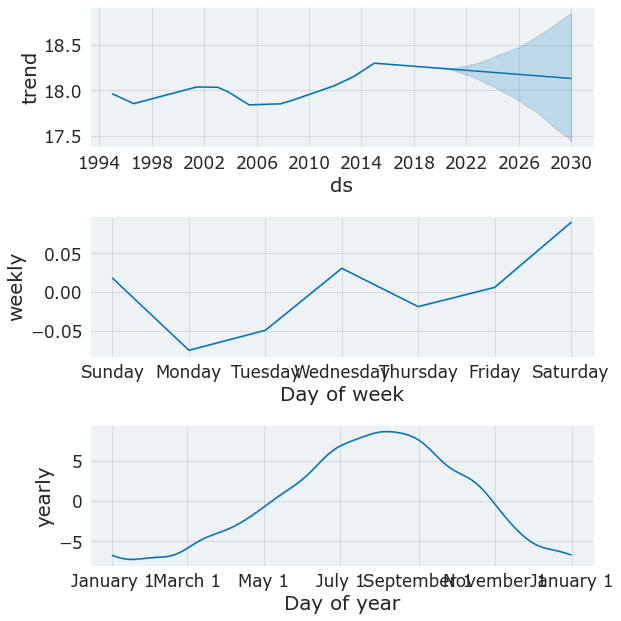

In [36]:
figure2 = model.plot_components(forecast)


In [37]:
plot_components_plotly(model, forecast)


In [38]:
pred.index = pred["ds"].values


In [39]:
pred = pred[pred["ds"] > "2020-05-13"]
pred

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
2020-05-14,2020-05-14,18.240159,15.920325,22.095159,18.238617,18.241529,0.720745,0.720745,0.720745,-0.018987,-0.018987,-0.018987,0.739732,0.739732,0.739732,0.0,0.0,0.0,18.960904
2020-05-15,2020-05-15,18.240128,16.070972,22.132674,18.238510,18.241496,0.852858,0.852858,0.852858,0.005874,0.005874,0.005874,0.846984,0.846984,0.846984,0.0,0.0,0.0,19.092986
2020-05-16,2020-05-16,18.240097,16.420214,22.460183,18.238435,18.241454,1.043028,1.043028,1.043028,0.089815,0.089815,0.089815,0.953212,0.953212,0.953212,0.0,0.0,0.0,19.283125
2020-05-17,2020-05-17,18.240066,16.265009,22.409517,18.238342,18.241442,1.076349,1.076349,1.076349,0.017781,0.017781,0.017781,1.058568,1.058568,1.058568,0.0,0.0,0.0,19.316415
2020-05-18,2020-05-18,18.240035,16.429828,22.402722,18.238292,18.241449,1.087827,1.087827,1.087827,-0.075423,-0.075423,-0.075423,1.163251,1.163251,1.163251,0.0,0.0,0.0,19.327863
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2029-12-24,2029-12-24,18.131679,8.816717,14.821578,17.441906,18.850408,-6.419388,-6.419388,-6.419388,-0.075423,-0.075423,-0.075423,-6.343964,-6.343964,-6.343964,0.0,0.0,0.0,11.712292
2029-12-25,2029-12-25,18.131648,8.245117,14.702382,17.441409,18.850776,-6.438697,-6.438697,-6.438697,-0.049580,-0.049580,-0.049580,-6.389117,-6.389117,-6.389117,0.0,0.0,0.0,11.692951
2029-12-26,2029-12-26,18.131617,8.637867,14.873700,17.440911,18.851169,-6.405942,-6.405942,-6.405942,0.030521,0.030521,0.030521,-6.436463,-6.436463,-6.436463,0.0,0.0,0.0,11.725675
2029-12-27,2029-12-27,18.131586,8.403341,14.419159,17.440413,18.851561,-6.504840,-6.504840,-6.504840,-0.018987,-0.018987,-0.018987,-6.485853,-6.485853,-6.485853,0.0,0.0,0.0,11.626746


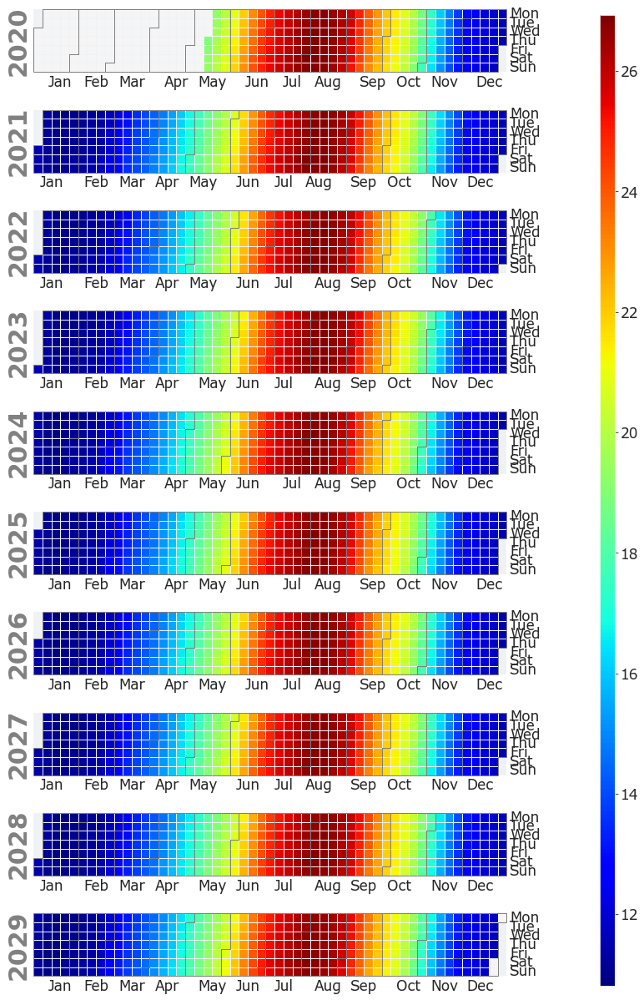

In [40]:
fig2 = calplot.calplot(pred["yhat"], how = "mean", cmap='jet')

In [41]:
df_cv = cross_validation(model, initial='1095 days', period='180 days', horizon = '365 days')


  0%|          | 0/43 [00:00<?, ?it/s]

03:06:39 - cmdstanpy - INFO - Chain [1] start processing
03:06:39 - cmdstanpy - INFO - Chain [1] done processing
03:06:39 - cmdstanpy - INFO - Chain [1] start processing
03:06:39 - cmdstanpy - INFO - Chain [1] done processing
03:06:39 - cmdstanpy - INFO - Chain [1] start processing
03:06:40 - cmdstanpy - INFO - Chain [1] done processing
03:06:40 - cmdstanpy - INFO - Chain [1] start processing
03:06:40 - cmdstanpy - INFO - Chain [1] done processing
03:06:40 - cmdstanpy - INFO - Chain [1] start processing
03:06:41 - cmdstanpy - INFO - Chain [1] done processing
03:06:41 - cmdstanpy - INFO - Chain [1] start processing
03:06:41 - cmdstanpy - INFO - Chain [1] done processing
03:06:41 - cmdstanpy - INFO - Chain [1] start processing
03:06:42 - cmdstanpy - INFO - Chain [1] done processing
03:06:42 - cmdstanpy - INFO - Chain [1] start processing
03:06:42 - cmdstanpy - INFO - Chain [1] done processing
03:06:43 - cmdstanpy - INFO - Chain [1] start processing
03:06:43 - cmdstanpy - INFO - Chain [1]

In [42]:
df_cv


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1998-04-21,15.636419,12.875145,18.375632,17.888889,1998-04-20
1,1998-04-22,15.749297,12.869267,18.417464,16.611111,1998-04-20
2,1998-04-23,15.502248,12.879508,18.271347,15.111111,1998-04-20
3,1998-04-24,15.719590,12.661322,18.683104,17.000000,1998-04-20
4,1998-04-25,16.063596,13.126475,19.150028,17.166667,1998-04-20
...,...,...,...,...,...,...
15630,2019-12-27,11.776967,8.443059,14.873281,10.611111,2018-12-31
15631,2019-12-28,11.809467,8.699535,14.881282,10.166667,2018-12-31
15632,2019-12-29,11.700276,8.499919,14.668194,10.500000,2018-12-31
15633,2019-12-30,11.576006,8.458345,14.582959,9.944444,2018-12-31


In [43]:
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,6.268720,2.503741,1.928377,0.129698,0.085073,0.123053,0.799253
1,38 days,6.261737,2.502346,1.922694,0.129013,0.085381,0.122525,0.799149
2,39 days,6.266102,2.503218,1.914767,0.128155,0.084758,0.121797,0.799789
3,40 days,6.307207,2.511415,1.916270,0.127962,0.083288,0.121649,0.799417
4,41 days,6.371052,2.524094,1.925252,0.128570,0.083843,0.122028,0.796590


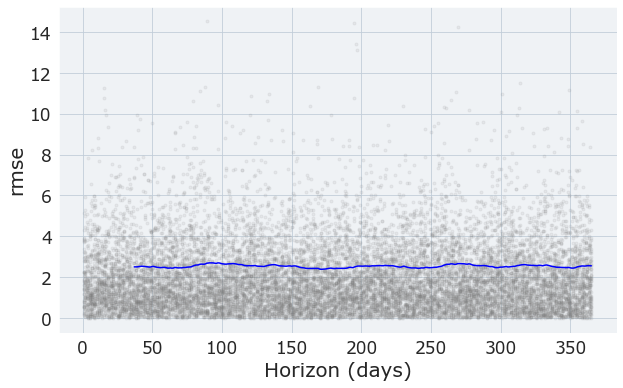

In [44]:
figure3 = plot_cross_validation_metric(df_cv, metric='rmse')


In [45]:
pred['yhat']['2029-12-28']

11.600379426584325